In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from copy import copy
from scipy import stats
import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objects as go
import pprint


## Part 1: Getting the Data
##




In [2]:
#######################

import sys
sys.path.append('/home/pi/Documents/Python/alphapp')




import myauz
from myauz.myalpha_funcs import (
    read_data,
    persist_data,
    update_csv,
    compose_portfolio,
    retrieveDF,
    string2date,
    retrievePF,
    initialize_df,
    time_sleep,
    create_path_list,
    refresh_db,
    get_daily_symbol,
)

#import importlib
#importlib.reload(myauz.myalpha_funcs)

from myauz.myalpha_libs_universal import StocksDb

import pprint


from datetime import date
import datetime
import pandas as pd



In [3]:
alphaDB = StocksDb()
alphaDB.check_path()
print("\n", alphaDB.api_key_alpha)


api_key_alpha = alphaDB.api_key_alpha
root_path = alphaDB.path
print('root_path: ',root_path)

read_from_alphavantage = False
rename_column = True


usecols = ["timestamp", "adjusted_close"]
startd = "2010-01-01"
endd = "2020-09-17"

print('usecols:', usecols)
print('startd',startd)
print('endd',endd)


Directory  /home/pi/Documents/Python/data  already exists

 77K8XPSR3XWWZJ80
root_path:  /home/pi/Documents/Python
usecols: ['timestamp', 'adjusted_close']
startd 2010-01-01
endd 2020-09-17


In [4]:
#plt.minorticks_on()
# Customize the major grid
#plt.grid(which='major', linestyle='-', linewidth='0.5', color='dimgray')
# Customize the minor grid
#plt.grid(which='minor', linestyle=':', linewidth='0.25', color='gray')

In [5]:
#symbol_list = ["DHR", "GOOG"]

symbol_list = [
   "MSFT",
   "GOOG",    
   "DHR",
   "EMR",
   "ATR",
   "HXGBY",
   "NVS",
   "NVZMY",    
   "CL",
   "MCD",    
   "HEINY",
   "LDSVF",  
]

path_list = create_path_list(symbol_list, root_path)
pprint.pprint(path_list)

bool_list_all = [
   True, #"MSFT", microsoft    
   True, #"GOOG", alphabet google      
#  True, #"AMZN", amazon
   True, #"DHR", danaher
   True, #"EMR", emerson    
   True, #"ATR", aptargroup
   True, #"HXGBY", hexagon
   True, #"NVS", novartis
   True, #"NVZMY", novozymes    
   True, #"CL", colgate palmolive
   True, #"MCD", mcdonalds    
   True, #"HEINY", heineken
   True, #"LDSVF", lindt & spruengli    
]

bool_list_high_tech = [
   True, #"MSFT", microsoft    
   True, #"GOOG", alphabet google      
#  True, #"AMZN", amazon
   False, #"DHR", danaher
   False, #"EMR", emerson    
   False, #"ATR", aptargroup
   False, #"HXGBY", hexagon
   False, #"NVS", novartis
   False, #"NVZMY", novozymes    
   False, #"CL", colgate palmolive
   False, #"MCD", mcdonalds    
   False, #"HEINY", heineken
   False, #"LDSVF", lindt & spruengli    
]

bool_list_industry = [
   False, #"MSFT", microsoft    
   False, #"GOOG", alphabet google      
#  False, #"AMZN", amazon
   True, #"DHR", danaher
   True, #"EMR", emerson    
   True, #"ATR", aptargroup
   True, #"HXGBY", hexagon
   True, #"NVS", novartis
   True, #"NVZMY", novozymes    
   False, #"CL", colgate palmolive
   False, #"MCD", mcdonalds    
   False, #"HEINY", heineken
   False, #"LDSVF", lindt & spruengli    
]

bool_list_consumer = [
   False, #"MSFT", microsoft    
   False, #"GOOG", alphabet google      
#  False, #"AMZN", amazon
   False, #"DHR", danaher
   False, #"EMR", emerson    
   False, #"ATR", aptargroup
   False, #"HXGBY", hexagon
   False, #"NVS", novartis
   False, #"NVZMY", novozymes    
   True, #"CL", colgate palmolive
   True, #"MCD", mcdonalds    
   True, #"HEINY", heineken
   True, #"LDSVF", lindt & spruengli    
]

colors = [
    'magenta',
    'lime',
#   'tab:orange',
    'blue',
    'black',
    'slategrey',
    'tab:brown',
    'tab:olive',
    'darkviolet',
    'red',
    'turquoise',
    'forestgreen',
    'gold',
]

color_dict = dict(zip(symbol_list, colors))
print('\n')
print(color_dict)

{'ATR': '/home/pi/Documents/Python/data/ATR/daily_ATR.csv',
 'CL': '/home/pi/Documents/Python/data/CL/daily_CL.csv',
 'DHR': '/home/pi/Documents/Python/data/DHR/daily_DHR.csv',
 'EMR': '/home/pi/Documents/Python/data/EMR/daily_EMR.csv',
 'GOOG': '/home/pi/Documents/Python/data/GOOG/daily_GOOG.csv',
 'HEINY': '/home/pi/Documents/Python/data/HEINY/daily_HEINY.csv',
 'HXGBY': '/home/pi/Documents/Python/data/HXGBY/daily_HXGBY.csv',
 'LDSVF': '/home/pi/Documents/Python/data/LDSVF/daily_LDSVF.csv',
 'MCD': '/home/pi/Documents/Python/data/MCD/daily_MCD.csv',
 'MSFT': '/home/pi/Documents/Python/data/MSFT/daily_MSFT.csv',
 'NVS': '/home/pi/Documents/Python/data/NVS/daily_NVS.csv',
 'NVZMY': '/home/pi/Documents/Python/data/NVZMY/daily_NVZMY.csv'}


{'MSFT': 'magenta', 'GOOG': 'lime', 'DHR': 'blue', 'EMR': 'black', 'ATR': 'slategrey', 'HXGBY': 'tab:brown', 'NVS': 'tab:olive', 'NVZMY': 'darkviolet', 'CL': 'red', 'MCD': 'turquoise', 'HEINY': 'forestgreen', 'LDSVF': 'gold'}


In [6]:
#df[cols].plot(color = [color_dict.get(x, _) for x in df.columns])

# Full refresh of DB con time delay
# use refresh_db(root_path, api_key_alpha, symbol_list, False)


In [7]:
### create dataframe with portfolio adjusted close
usecols = ["timestamp", "adjusted_close"]
pf = retrievePF(symbol_list, path_list, startd, endd, usecols, rename_column)
print(pf) 
pf.tail()

                  MSFT     GOOG         DHR        EMR         ATR      HXGBY  \
2010-01-04   24.107004      NaN   27.440836  31.071035   30.515889        NaN   
2010-01-05   24.114793      NaN   27.407973  31.121208   30.482207        NaN   
2010-01-06   23.966802      NaN   27.459094  31.400740   30.945334        NaN   
2010-01-07   23.719111      NaN   27.685485  31.400740   30.945334        NaN   
2010-01-08   23.881123      NaN   28.072542  31.579927   30.970596        NaN   
...                ...      ...         ...        ...         ...        ...   
2020-09-10  204.826590  1532.02  202.913690  67.053821  116.826338  72.790883   
2020-09-11  203.490136  1520.72  204.692144  67.461050  117.992708  74.010177   
2020-09-14  204.866485  1519.28  207.749488  67.729226  118.710473  74.812533   
2020-09-15  208.227568  1541.44  208.508828  67.947739  117.962801  74.862692   
2020-09-16  204.507437  1520.90  206.870252  68.215915  117.404538  75.616077   

                  NVS      

,MSFT,GOOG,DHR,EMR,ATR,HXGBY,NVS,NVZMY,CL,MCD,HEINY,LDSVF
2020-09-10,204.826590,1532.02,202.913690,67.053821,116.826338,72.790883,88.52,63.730,75.988322,215.958788,45.445,8559.35
2020-09-11,203.490136,1520.72,204.692144,67.461050,117.992708,74.010177,89.88,65.590,76.326446,216.714305,45.420,8559.35
2020-09-14,204.866485,1519.28,207.749488,67.729226,118.710473,74.812533,90.03,65.275,76.724238,219.259207,45.990,8588.50
2020-09-15,208.227568,1541.44,208.508828,67.947739,117.962801,74.862692,91.00,65.220,76.515397,221.058532,46.030,8450.00
2020-09-16,204.507437,1520.90,206.870252,68.215915,117.404538,75.616077,89.85,65.980,76.485563,223.484142,45.650,8450.00


In [8]:
### create dataframe with volumes of portfolio
usecols = ["timestamp", "volume"]
pf_vol = retrievePF(symbol_list, path_list, startd, endd, usecols, rename_column)
print(pf_vol)

                  MSFT       GOOG        DHR        EMR       ATR    HXGBY  \
2010-01-04  38409100.0        NaN  1972200.0  3781000.0  250200.0      NaN   
2010-01-05  49749600.0        NaN  1706700.0  2707500.0  150300.0      NaN   
2010-01-06  58182400.0        NaN  1880500.0  4314700.0  400900.0      NaN   
2010-01-07  50559700.0        NaN  1663700.0  3085700.0  126000.0      NaN   
2010-01-08  51197400.0        NaN  2251200.0  3477500.0   79800.0      NaN   
...                ...        ...        ...        ...       ...      ...   
2020-09-10  35461514.0  1618557.0  2416048.0  2226976.0  253479.0  15302.0   
2020-09-11  33620073.0  1597087.0  1890488.0  2253642.0  124582.0   5747.0   
2020-09-14  30375768.0  1696589.0  1720913.0  2684342.0  129030.0   5911.0   
2020-09-15  21823942.0  1331082.0  1591507.0  2233592.0  125633.0   5916.0   
2020-09-16  26372464.0  1312299.0  1823578.0  3143617.0  232032.0   8991.0   

                   NVS    NVZMY         CL         MCD     HEIN

## Part 2: Visualizing the Data

** Time to visualize the data. **

** Follow along and recreate the plots below according to the instructions and explanations. **

In [9]:
# filter columns(symbols) in dataframe  by bool_list(symbols = True - this is the _included list)
def pf_filtered(_pf, _startd, _included):
    if not (_startd):
        _startd = '2020-01-01'
    if _included is []:
        return _pf
    else: 
        return _pf.loc[startd:,_included]

from itertools import compress
def symbol_list_filtered(_symbol_list,_included):
    #filter the symbol_list
    #symbol_list_filtered = [i for indx,i in enumerate(symbol_list) if included[indx]]
    return list(compress(_symbol_list, _included))

def determine_earliest_notation(_pf):
    """
    input:
    ------
         portfolio - columns = symbol  - import also symbol_list
    
    output:
    -------
         dataframe with one row containing earliest notation in time of symbol in portfolio
    
    """
    _pf_tmp = _pf.copy()
    _pf_tmp.fillna(0, inplace=True)
    _symbol_list = list(_pf_tmp.columns)
    _df_aux_0 = _pf_tmp.iloc[0]
    
    for symbol in _symbol_list:
        _df_aux_0[symbol] = (_pf_tmp[_pf_tmp[symbol] > 0].iloc[0]).loc[symbol]  
    return _df_aux_0

In [10]:
 
df_aux = determine_earliest_notation(pf)
print(df_aux)

print('\n')

df_vol_aux = determine_earliest_notation(pf_vol)
print(df_vol_aux)

"""
print('\n something:')
_df_aux = pf.iloc[0]
_df_aux['MSFT'] = (pf[pf['MSFT'] > 0].iloc[0]).loc['MSFT']
_df_aux['GOOG'] = (pf[pf['GOOG'] > 0].iloc[0]).loc['GOOG']
_df_aux['HXGBY'] = (pf[pf['HXGBY'] > 0].iloc[0]).loc['HXGBY']
_df_aux['HEINY'] = (pf[pf['HEINY'] > 0].iloc[0]).loc['HEINY']
print(_df_aux)
#print(pf.iloc[0])
"""
    

MSFT       24.107004
GOOG      558.460000
DHR        27.440836
EMR        31.071035
ATR        30.515889
HXGBY      18.282870
NVS        35.545114
NVZMY      19.943745
CL         31.953995
MCD        45.472850
HEINY      29.481441
LDSVF    2096.412048
Name: 2010-01-04 00:00:00, dtype: float64


MSFT     38409100.0
GOOG        13100.0
DHR       1972200.0
EMR       3781000.0
ATR        250200.0
HXGBY         169.0
NVS      11128887.0
NVZMY        1079.0
CL        2437100.0
MCD       5839300.0
HEINY        1292.0
LDSVF          75.0
Name: 2010-01-04 00:00:00, dtype: float64


"\nprint('\n something:')\n_df_aux = pf.iloc[0]\n_df_aux['MSFT'] = (pf[pf['MSFT'] > 0].iloc[0]).loc['MSFT']\n_df_aux['GOOG'] = (pf[pf['GOOG'] > 0].iloc[0]).loc['GOOG']\n_df_aux['HXGBY'] = (pf[pf['HXGBY'] > 0].iloc[0]).loc['HXGBY']\n_df_aux['HEINY'] = (pf[pf['HEINY'] > 0].iloc[0]).loc['HEINY']\nprint(_df_aux)\n#print(pf.iloc[0])\n"

____

** Recreate this linear plot of all the stocks' Open price ! Hint: For the legend, use label parameter and plt.legend()**

darkviolet


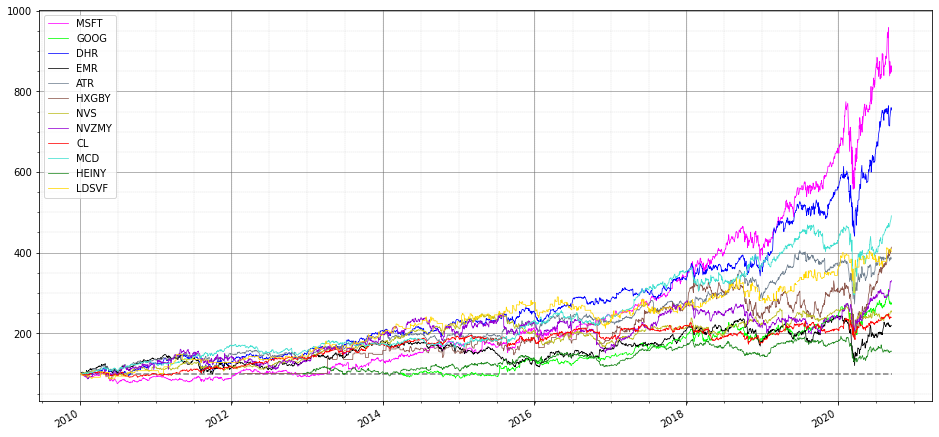

In [11]:
#print(pf.iloc[0])
#df_aux replaces pf.iloc[0]
print(color_dict.get('NVZMY'))

color_list = [color_dict.get(x, _) for x in pf.columns]



(pf / df_aux * 100).plot(color=color_list, figsize=(16, 8), linewidth=0.75)
plt.hlines(100, startd,endd,colors='gray', linestyles='--')
plt.legend(loc=2)

plt.minorticks_on()
# Customize the major grid
plt.grid(which='major', linestyle='-', linewidth='0.5', color='dimgray')
# Customize the minor grid
plt.grid(which='minor', linestyle=':', linewidth='0.25', color='gray')


In [12]:
print(pf['NVZMY'].max())
print(pf['NVZMY'].idxmax())
#pf['2011-12-01':'2011-12-31']

65.98
2020-09-16 00:00:00


____

** Plot the Volume of stock traded each day.**

['MSFT',
 'GOOG',
 'DHR',
 'EMR',
 'ATR',
 'HXGBY',
 'NVS',
 'NVZMY',
 'CL',
 'MCD',
 'HEINY',
 'LDSVF']

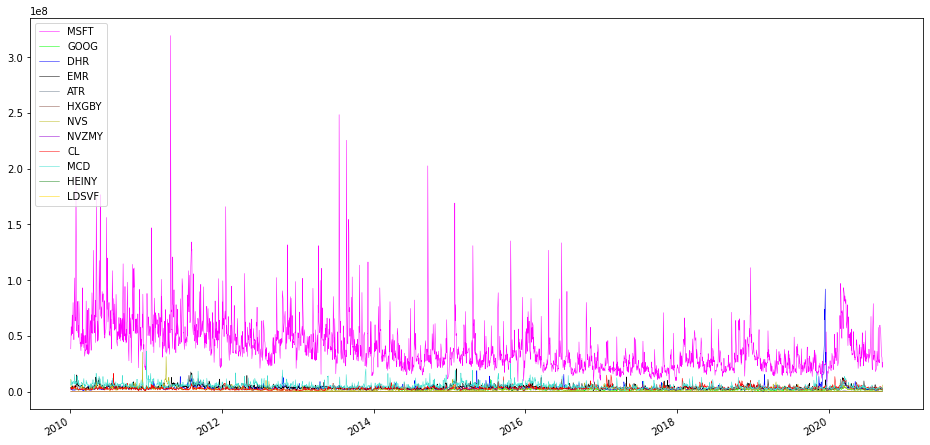

In [13]:
pf_vol.iloc[0]

(pf_vol).plot(color=color_list,figsize=(16, 8),linewidth=0.5)
plt.legend(loc=2);
list(pf_vol.columns)

In [14]:
print(pf_vol.max())
pf_vol.idxmax()

MSFT     319317900.0
GOOG      11164943.0
DHR       92051847.0
EMR       20572890.0
ATR        2431400.0
HXGBY       942309.0
NVS       35374520.0
NVZMY       809875.0
CL        16469500.0
MCD       36471600.0
HEINY      1534305.0
LDSVF         2000.0
dtype: float64


MSFT    2011-04-29
GOOG    2015-07-17
DHR     2019-12-16
EMR     2015-02-03
ATR     2012-05-31
HXGBY   2020-02-14
NVS     2010-12-15
NVZMY   2016-12-09
CL      2010-07-29
MCD     2011-01-04
HEINY   2015-10-29
LDSVF   2013-10-18
dtype: datetime64[ns]

** The Open Price Time Series Visualization makes Tesla look like its always been much more valuable as a company than GM and Ford. But to really understand this we would need to look at the total market cap of the company, not just the stock price. Unfortunately our current data doesn't have that information of total units of stock present. But what we can do as a simple calcualtion to try to represent total money traded would be to multply the Volume column by the Open price. Remember that this still isn't the actual Market Cap, its just a visual representation of the total amount of money being traded around using the time series. (e.g. 100 units of stock at \$10 each versus 100000 units of stock at $1 each)**

** Create a new column for each dataframe called "Total Traded" which is the Open Price multiplied by the Volume Traded.**

MSFT     1.701634e+10
GOOG     7.513225e+09
DHR      1.388020e+10
EMR      1.009344e+09
ATR      1.129993e+08
HXGBY    5.474803e+07
NVS      1.460500e+09
NVZMY    3.959227e+07
CL       9.898669e+08
MCD      3.226754e+09
HEINY    6.539606e+07
LDSVF    8.001834e+06
total    2.560129e+10
dtype: float64
MSFT    2020-08-03
GOOG    2015-07-17
DHR     2019-12-16
EMR     2015-02-03
ATR     2014-01-17
HXGBY   2020-02-14
NVS     2010-12-15
NVZMY   2018-03-16
CL      2017-02-17
MCD     2019-11-04
HEINY   2015-10-29
LDSVF   2013-10-18
total   2020-02-28
dtype: datetime64[ns]


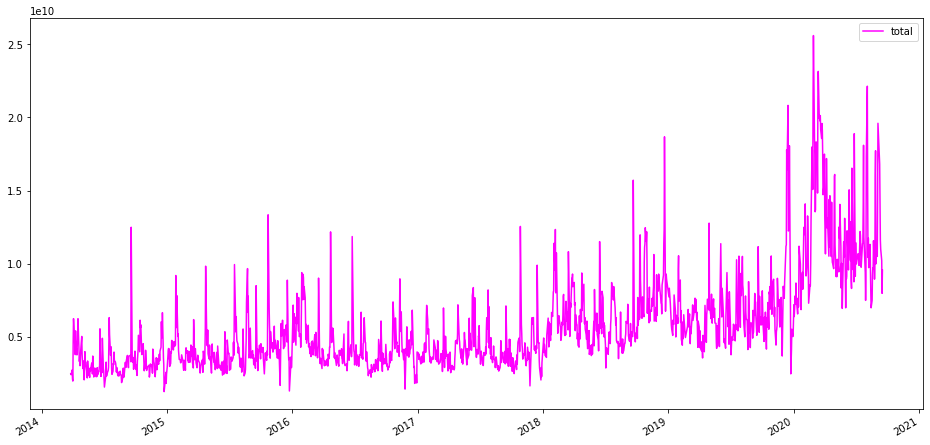

In [15]:
df_cap = initialize_df(symbol_list, startd, endd)

df_cap=(pf*pf_vol)
df_cap['total']=(pf*pf_vol).sum(axis=1)
df_cap.tail()
print(df_cap.max())
print(df_cap.idxmax())

df_cap.dropna(inplace=True)
#df_cap.plot.bar(figsize=(16,8))
df_cap['total'].plot(color=color_list,figsize=(16,8))
plt.legend();




** Plot this "Total Traded" against the time index.**

____

** Let's practice plotting out some MA (Moving Averages). Plot out the MA50 and MA200 for GM. **

            MSFT   adj.close        MA20        MA50
2020-01-02     0  158.935751  153.351428  148.016821
2020-01-03     0  156.956723  153.785330  148.466323
2020-01-06     0  157.362424  154.235559  148.906780
2020-01-07     0  155.927628  154.524003  149.265288
2020-01-08     0  158.411309  154.955925  149.657889


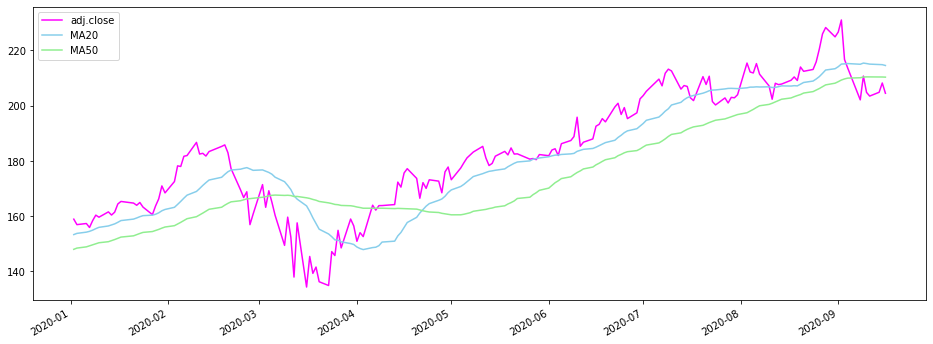

In [16]:
# Code here
MSFT = initialize_df(['MSFT'], '2020-01-01', endd)

MSFT['adj.close'] = pf['MSFT']
MSFT.dropna(inplace=True)
MSFT['MA20']=pf['MSFT'].rolling(window=20).mean()
MSFT['MA50']=pf['MSFT'].rolling(window=50).mean()
color_list = [color_dict.get(x, _) for x in pf.columns]
MSFT[['adj.close','MA20','MA50']].plot(color=['magenta','skyblue','lightgreen'],figsize=(16,6));
print(MSFT.head())


______

** Finally lets see if there is a relationship between these stocks, after all, they are all related to the car industry. We can see this easily through a scatter matrix plot. Import scatter_matrix from pandas.plotting and use it to create a scatter matrix plot of all the stocks'opening price. You may need to rearrange the columns into a new single dataframe. Hints and info can be found here: https://pandas.pydata.org/pandas-docs/stable/visualization.html#scatter-matrix-plot **

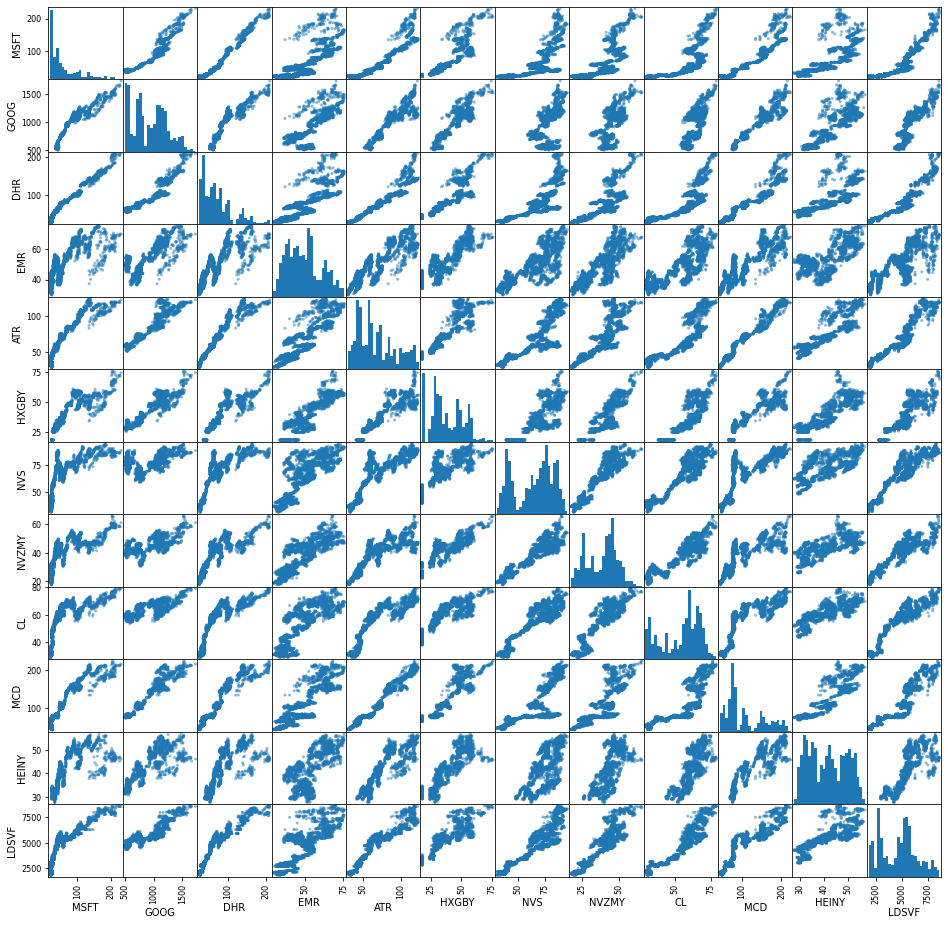

In [17]:
#from pandas.plotting import scatter_matrix
#scatter_matrix(pf, figsize=(16,16),alpha=0.2, hist_kwds={'bins':25});

# alpha - it is darker where points overlap

from pandas.plotting import scatter_matrix
scatter_matrix(pf, figsize=(16,16),alpha=0.5, hist_kwds={'bins':25});
# alpha - it is darker where points overlap

____
# Part 3: Basic Financial Analysis

Now it is time to focus on a few key financial calculations. This will serve as your transition to the second half of the course. All you need to do is follow along with the instructions, this will mainly be an exercise in converting a mathematical equation or concept into code using python and pandas, something we will do often when working with quantiative data! If you feel very lost in this section, don't worry! Just go to the solutions lecture and treat it as a code-along lecture, use whatever style of learning works best for you!

Let's begin!
____

## Daily Percentage Change
First we will begin by calculating the daily percentage change. Daily percentage change is defined by the following formula:

$ r_t = \frac{p_t}{p_{t-1}} -1$

This defines r_t (return at time t) as equal to the price at time t divided by the price at time t-1 (the previous day) minus 1. Basically this just informs you of your percent gain (or loss) if you bought the stock on day and then sold it the next day. While this isn't necessarily helpful for attempting to predict future values of the stock, its very helpful in analyzing the volatility of the stock. If daily returns have a wide distribution, the stock is more volatile from one day to the next. Let's calculate the percent returns and then plot them with a histogram, and decide which stock is the most stable!

** Create a new column for each dataframe called returns. This column will be calculated from the Close price column. There are two ways to do this, either a simple calculation using the .shift() method that follows the formula above, or you can also use pandas' built in pct_change method. **

In [18]:
#tesla['returns'] = (tesla['close']/tesla['close'].shift(1))-1
#tesla.head()

In [19]:
#tesla['returns']=tesla['close'].pct_change(1)
#tesla.head()
#gm['returns']=gm['close'].pct_change(1)
#ford['returns']=ford['close'].pct_change(1)

In [20]:
df_returns = (pf/pf.shift(1))-1
#np.log(pf/pf.shift(1)).dropna()
#ret = pf.pct_change(1)
pprint.pprint(df_returns.head())

print('___________________')

#df1_returns = pf_filtered(df_returns, startd, bool_list_high_tech)


                MSFT  GOOG       DHR       EMR       ATR  HXGBY       NVS  \
2010-01-04       NaN   NaN       NaN       NaN       NaN    NaN       NaN   
2010-01-05  0.000323   NaN -0.001198  0.001615 -0.001104    NaN -0.000950   
2010-01-06 -0.006137   NaN  0.001865  0.008982  0.015193    NaN -0.003615   
2010-01-07 -0.010335   NaN  0.008245  0.000000  0.000000    NaN -0.008784   
2010-01-08  0.006830   NaN  0.013980  0.005706  0.000816    NaN  0.008091   

               NVZMY        CL       MCD  HEINY     LDSVF  
2010-01-04       NaN       NaN       NaN    NaN       NaN  
2010-01-05  0.004063  0.008087 -0.007646    NaN -0.008482  
2010-01-06 -0.026529 -0.002275 -0.013644    NaN  0.008555  
2010-01-07  0.011547 -0.003960  0.007323    NaN  0.000000  
2010-01-08 -0.017808 -0.017952 -0.000969    NaN -0.038393  
___________________


** Now plot a histogram of each companies returns. Either do them separately, or stack them on top of each other. Which stock is the most "volatile"? (as judged by the variance in the daily returns we will discuss volatility in a lot more detail in future lectures.)**

In [21]:
#ford['returns'].hist(bins=50, figsize=(10,8), alpha=0.4, color='forestgreen')
#tesla['returns'].hist(bins=50, figsize=(10,8), alpha=0.4, color='steelblue')
#gm['returns'].hist(bins=50, figsize=(10,8), alpha=0.2, color='darkorange');

In [22]:
#ford['returns'].plot(kind='kde', figsize=(10,8), label='Ford', color='forestgreen')
#tesla['returns'].plot(kind='kde', figsize=(10,8), label='Tesla', color='steelblue')
#gm['returns'].plot(kind='kde', figsize=(10,8), label='GM', color='darkorange');
#plt.legend();

In [23]:
#df_returns= pd.concat([tesla['returns'], ford['returns'], gm['returns']], axis=1)
#df_returns.columns = ['Tesla', 'Ford', 'GM']
#df_returns.plot(kind='box', figsize=(8,11))

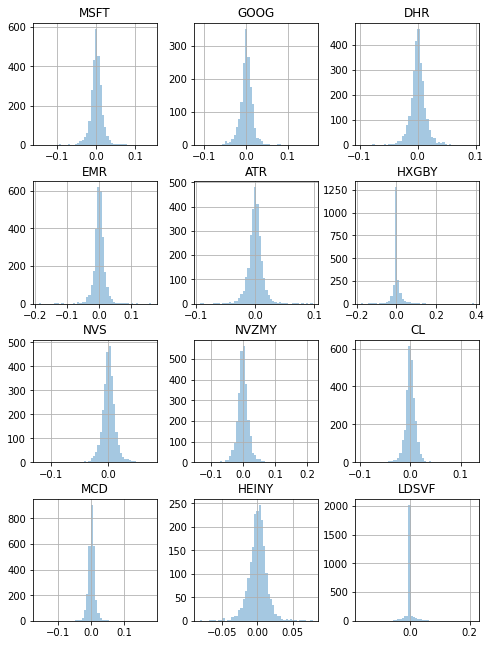

In [24]:
df_returns.hist(bins=50,figsize=(8,11),alpha=0.4);


In [25]:
df_returns.fillna(value=0,inplace=True)
data = []

for i in df_returns.columns:
    data.append(df_returns[i].values)
    
data

[array([ 0.        ,  0.0003231 , -0.00613695, ...,  0.00676371,
         0.01640621, -0.0178657 ]),
 array([ 0.        ,  0.        ,  0.        , ..., -0.00094692,
         0.01458586, -0.0133252 ]),
 array([ 0.        , -0.0011976 ,  0.00186517, ...,  0.0149363 ,
         0.00365508, -0.00785855]),
 array([0.        , 0.00161476, 0.00898204, ..., 0.00397527, 0.00322628,
        0.00394679]),
 array([ 0.        , -0.00110375,  0.01519337, ...,  0.00608314,
        -0.00629829, -0.00473253]),
 array([0.        , 0.        , 0.        , ..., 0.01084115, 0.00067047,
        0.01006356]),
 array([ 0.        , -0.00095039, -0.00361492, ...,  0.00166889,
         0.01077419, -0.01263736]),
 array([ 0.        ,  0.00406321, -0.02652878, ..., -0.00480256,
        -0.00084259,  0.01165287]),
 array([ 0.        ,  0.0080869 , -0.0022749 , ...,  0.00521173,
        -0.00272197, -0.00038991]),
 array([ 0.        , -0.00764575, -0.01364366, ...,  0.01174312,
         0.00820638,  0.0109727 ]),
 a

In [26]:
import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objects as go
    
fig = ff.create_distplot(data, df_returns.columns)
fig.show()

In [27]:
#daily return correlatio
corr_matrix = df_returns.corr()
corr_matrix

,MSFT,GOOG,DHR,EMR,ATR,HXGBY,NVS,NVZMY,CL,MCD,HEINY,LDSVF
MSFT,1.000000,0.588619,0.562972,0.510916,0.479958,0.299205,0.460762,0.259560,0.429546,0.472234,0.312136,0.059887
GOOG,0.588619,1.000000,0.398677,0.373571,0.314190,0.307217,0.335258,0.161341,0.315000,0.386911,0.320837,0.049540
DHR,0.562972,0.398677,1.000000,0.596609,0.564921,0.230344,0.523918,0.291968,0.469296,0.481731,0.288010,0.083533
EMR,0.510916,0.373571,0.596609,1.000000,0.550218,0.307501,0.443287,0.286480,0.384028,0.491685,0.324763,0.065787
ATR,0.479958,0.314190,0.564921,0.550218,1.000000,0.226651,0.456330,0.274909,0.464653,0.444848,0.294482,0.055618
HXGBY,0.299205,0.307217,0.230344,0.307501,0.226651,1.000000,0.227649,0.150616,0.222366,0.255932,0.230355,0.108210
NVS,0.460762,0.335258,0.523918,0.443287,0.456330,0.227649,1.000000,0.333624,0.426041,0.394436,0.407215,0.113441
NVZMY,0.259560,0.161341,0.291968,0.286480,0.274909,0.150616,0.333624,1.000000,0.224319,0.195904,0.222896,0.047942
CL,0.429546,0.315000,0.469296,0.384028,0.464653,0.222366,0.426041,0.224319,1.000000,0.445372,0.336959,0.070288
MCD,0.472234,0.386911,0.481731,0.491685,0.444848,0.255932,0.394436,0.195904,0.445372,1.000000,0.287523,0.033514


In [28]:
corr_matrix_triangle = np.triu(df_returns.corr())
corr_matrix_triangle

array([[1.        , 0.58861867, 0.56297159, 0.51091568, 0.4799583 ,
        0.29920529, 0.46076232, 0.25956018, 0.42954595, 0.47223384,
        0.31213618, 0.05988654],
       [0.        , 1.        , 0.39867667, 0.37357081, 0.31418971,
        0.30721727, 0.33525785, 0.16134067, 0.31499997, 0.38691114,
        0.32083709, 0.04954005],
       [0.        , 0.        , 1.        , 0.59660911, 0.56492137,
        0.23034427, 0.52391768, 0.29196844, 0.46929621, 0.48173067,
        0.28800967, 0.08353312],
       [0.        , 0.        , 0.        , 1.        , 0.55021813,
        0.30750064, 0.44328689, 0.28648026, 0.38402784, 0.49168471,
        0.32476306, 0.06578726],
       [0.        , 0.        , 0.        , 0.        , 1.        ,
        0.22665107, 0.4563296 , 0.27490916, 0.46465306, 0.44484752,
        0.2944816 , 0.05561842],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        1.        , 0.22764944, 0.15061585, 0.22236639, 0.25593249,
        0.23035525,

In [29]:
#corr_pairs = corr_matrix.unstack()
#print(corr_pairs)
#sorted_pairs = corr_pairs.sort_values(kind="quicksort")
#print(sorted_pairs[sorted_pairs<1.0])
#type(sorted_pairs)
#print(sorted_pairs.unstack())

korr=corr_matrix.unstack().sort_values(kind="quicksort")

korr=(korr.drop_duplicates())
print(korr[korr>0.45])




ATR   NVS     0.456330
NVS   MSFT    0.460762
ATR   CL      0.464653
DHR   CL      0.469296
MCD   MSFT    0.472234
MSFT  ATR     0.479958
DHR   MCD     0.481731
EMR   MCD     0.491685
      MSFT    0.510916
NVS   DHR     0.523918
EMR   ATR     0.550218
MSFT  DHR     0.562972
ATR   DHR     0.564921
MSFT  GOOG    0.588619
DHR   EMR     0.596609
MSFT  MSFT    1.000000
dtype: float64


<AxesSubplot:>

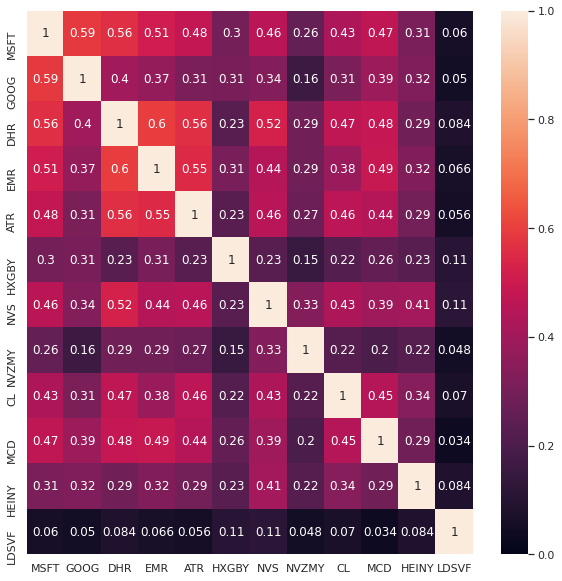

In [30]:
import seaborn as sns 
sns.set()
plt.figure(figsize=(10,10))
sns.heatmap(corr_matrix,vmin=0,  annot = True)

In [31]:
plt.figure(clear=True)

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

                MSFT  GOOG       DHR       EMR       ATR  HXGBY       NVS  \
2010-01-04  0.000000   0.0  0.000000  0.000000  0.000000    0.0  0.000000   
2010-01-05  0.000323   0.0 -0.001198  0.001615 -0.001104    0.0 -0.000950   
2010-01-06 -0.006137   0.0  0.001865  0.008982  0.015193    0.0 -0.003615   
2010-01-07 -0.010335   0.0  0.008245  0.000000  0.000000    0.0 -0.008784   
2010-01-08  0.006830   0.0  0.013980  0.005706  0.000816    0.0  0.008091   

               NVZMY        CL       MCD  HEINY     LDSVF  
2010-01-04  0.000000  0.000000  0.000000    0.0  0.000000  
2010-01-05  0.004063  0.008087 -0.007646    0.0 -0.008482  
2010-01-06 -0.026529 -0.002275 -0.013644    0.0  0.008555  
2010-01-07  0.011547 -0.003960  0.007323    0.0  0.000000  
2010-01-08 -0.017808 -0.017952 -0.000969    0.0 -0.038393  


<Figure size 432x288 with 0 Axes>

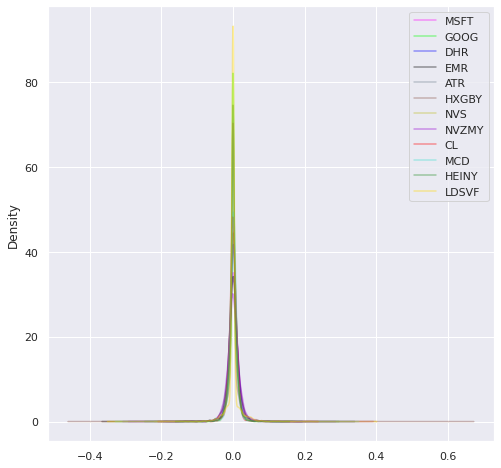

In [32]:
import seaborn as sns 
sns.set()

print(df_returns.head())

#sns.reset_orig
plt.figure()

color_list = [color_dict.get(x, _) for x in pf.columns]
df_returns.plot(kind='kde',color=color_list, figsize=(8,8), alpha=0.4)
plt.legend();


** Try also plotting a KDE instead of histograms for another view point. Which stock has the widest plot? **

** Try also creating some box plots comparing the returns. **

## Comparing Daily Returns between Stocks

** Create a scatter matrix plot to see the correlation between each of the stocks daily returns. This helps answer the questions of how related the car companies are. Is Tesla begin treated more as a technology company rather than a car company by the market?**

In [33]:
#pd.plotting.scatter_matrix(df_returns, figsize=(16,16), alpha= 0.4,hist_kwds={'bins':50});

** It looks like Google and Microsoft do have some sort of possible relationship, let's plot just these two against eachother in scatter plot to view this more closely!**

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


                MSFT  GOOG       DHR       EMR       ATR  HXGBY       NVS  \
2010-01-04  0.000000   0.0  0.000000  0.000000  0.000000    0.0  0.000000   
2010-01-05  0.000323   0.0 -0.001198  0.001615 -0.001104    0.0 -0.000950   
2010-01-06 -0.006137   0.0  0.001865  0.008982  0.015193    0.0 -0.003615   
2010-01-07 -0.010335   0.0  0.008245  0.000000  0.000000    0.0 -0.008784   
2010-01-08  0.006830   0.0  0.013980  0.005706  0.000816    0.0  0.008091   

               NVZMY        CL       MCD  HEINY     LDSVF  
2010-01-04  0.000000  0.000000  0.000000    0.0  0.000000  
2010-01-05  0.004063  0.008087 -0.007646    0.0 -0.008482  
2010-01-06 -0.026529 -0.002275 -0.013644    0.0  0.008555  
2010-01-07  0.011547 -0.003960  0.007323    0.0  0.000000  
2010-01-08 -0.017808 -0.017952 -0.000969    0.0 -0.038393  


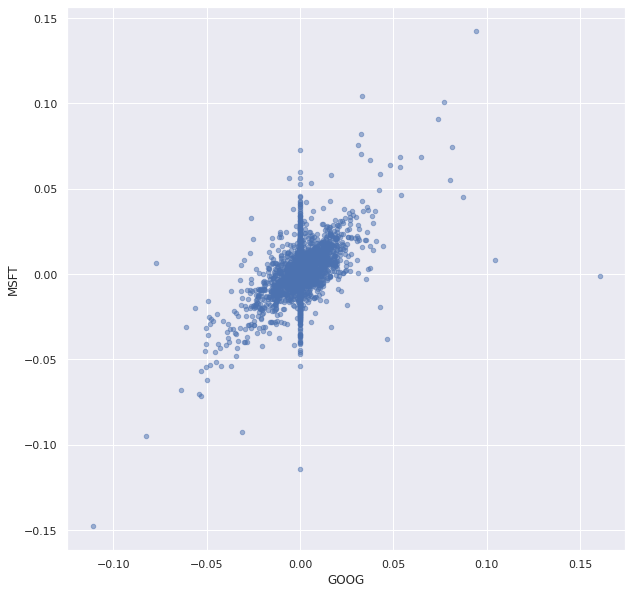

In [34]:
df_returns.plot(kind='scatter', x='GOOG', y='MSFT', alpha=0.5, figsize=(10,10));
print(df_returns.head())

____
## Cumulative Daily Returns

Great! Now we can see which stock was the most wide ranging in daily returns (you should have realized it was Tesla, our original stock price plot should have also made that obvious).

With daily cumulative returns, the question we are trying to answer is the following, if I invested $1 in the company at the beginning of the time series, how much would is be worth today? This is different than just the stock price at the current day, because it will take into account the daily returns. Keep in mind, our simple calculation here won't take into account stocks that give back a dividend. Let's look at some simple examples:

Lets us say there is a stock 'ABC' that is being actively traded on an exchange. ABC has the following prices corresponding to the dates given

    Date                        Price
    01/01/2018                   10
    01/02/2018                   15
    01/03/2018                   20
    01/04/2018                   25

**Daily Return** : Daily return is the profit/loss made by the stock compared to the previous day. (This is what ew just calculated above). A value above one indicates profit, similarly a value below one indicates loss. It is also expressed in percentage to convey the information better. (When expressed as percentage, if the value is above 0, the stock had give you profit else loss). So for the above example the daily returns would be

    Date                         Daily Return                  %Daily Return
    01/01/2018                 10/10 =  1                          -   
    01/02/2018                 15/10 =  3/2                       50%
    01/03/2018                 20/15 =  4/3                       33%
    01/04/2018                 25/20 =  5/4                       20%

**Cumulative Return**: While daily returns are useful, it doesn't give the investor a immediate insight into the gains he had made till date, especially if the stock is very volatile. Cumulative return is computed relative to the day investment is made.  If cumulative return is above one, you are making profits else you are in loss. So for the above example cumulative gains are as follows

    Date                       Cumulative Return         %Cumulative Return
    01/01/2018                  10/10 =  1                         100 %   
    01/02/2018                  15/10 =  3/2                       150 %
    01/03/2018                  20/10 =  2                         200 %
    01/04/2018                  25/10 =  5/2                       250 %

The formula for a cumulative daily return is:

$ i_i = (1+r_t) * i_{t-1} $

Here we can see we are just multiplying our previous investment at i at t-1 by 1+our percent returns. Pandas makes this very simple to calculate with its cumprod() method. Using something in the following manner:

    df[daily_cumulative_return] = ( 1 + df[pct_daily_return] ).cumprod()
    

** Create a cumulative daily return column for each car company's dataframe.**

In [35]:
#print(df_returns.head())
#tesla['returns']
#(1+tesla['returns'])
#(1+tesla['returns']).cumprod()
pprint.pprint(df_returns['MSFT'])
print('\n')
(1+df_returns['MSFT']).cumprod()

print(df_returns.head())

2010-01-04    0.000000
2010-01-05    0.000323
2010-01-06   -0.006137
2010-01-07   -0.010335
2010-01-08    0.006830
                ...   
2020-09-10   -0.028018
2020-09-11   -0.006525
2020-09-14    0.006764
2020-09-15    0.016406
2020-09-16   -0.017866
Name: MSFT, Length: 2695, dtype: float64


                MSFT  GOOG       DHR       EMR       ATR  HXGBY       NVS  \
2010-01-04  0.000000   0.0  0.000000  0.000000  0.000000    0.0  0.000000   
2010-01-05  0.000323   0.0 -0.001198  0.001615 -0.001104    0.0 -0.000950   
2010-01-06 -0.006137   0.0  0.001865  0.008982  0.015193    0.0 -0.003615   
2010-01-07 -0.010335   0.0  0.008245  0.000000  0.000000    0.0 -0.008784   
2010-01-08  0.006830   0.0  0.013980  0.005706  0.000816    0.0  0.008091   

               NVZMY        CL       MCD  HEINY     LDSVF  
2010-01-04  0.000000  0.000000  0.000000    0.0  0.000000  
2010-01-05  0.004063  0.008087 -0.007646    0.0 -0.008482  
2010-01-06 -0.026529 -0.002275 -0.013644    0.0  0.008555  
2

In [36]:
#tesla['cumRet']=(1+tesla['returns']).cumprod()
#tesla.head(10)
#gm['cumRet']=(1+gm['returns']).cumprod()
#ford['cumRet']=(1+ford['returns']).cumprod()

df_cum_returns = initialize_df(symbol_list, startd, endd)
df_cum_returns = (1+df_returns).cumprod()
df_cum_returns.head()

,MSFT,GOOG,DHR,EMR,ATR,HXGBY,NVS,NVZMY,CL,MCD,HEINY,LDSVF
2010-01-04,1.000000,1.0,1.000000,1.000000,1.000000,1.0,1.000000,1.000000,1.000000,1.000000,1.0,1.000000
2010-01-05,1.000323,1.0,0.998802,1.001615,0.998896,1.0,0.999050,1.004063,1.008087,0.992354,1.0,0.991518
2010-01-06,0.994184,1.0,1.000665,1.010611,1.014073,1.0,0.995438,0.977427,1.005794,0.978815,1.0,1.000000
2010-01-07,0.983910,1.0,1.008916,1.010611,1.014073,1.0,0.986695,0.988713,1.001811,0.985983,1.0,1.000000
2010-01-08,0.990630,1.0,1.023021,1.016378,1.014901,1.0,0.994678,0.971106,0.983826,0.985027,1.0,0.961607


** Now plot the Cumulative Return columns against the time series index. Which stock showed the highest return for a $1 invested? Which showed the lowest?**

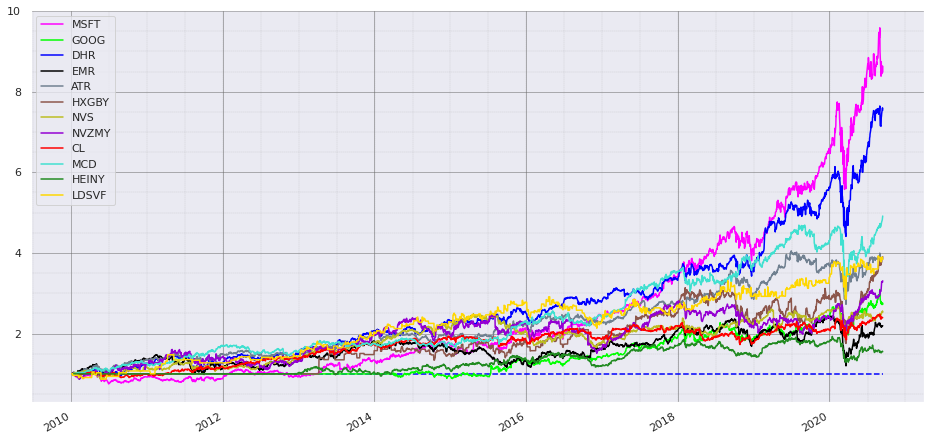

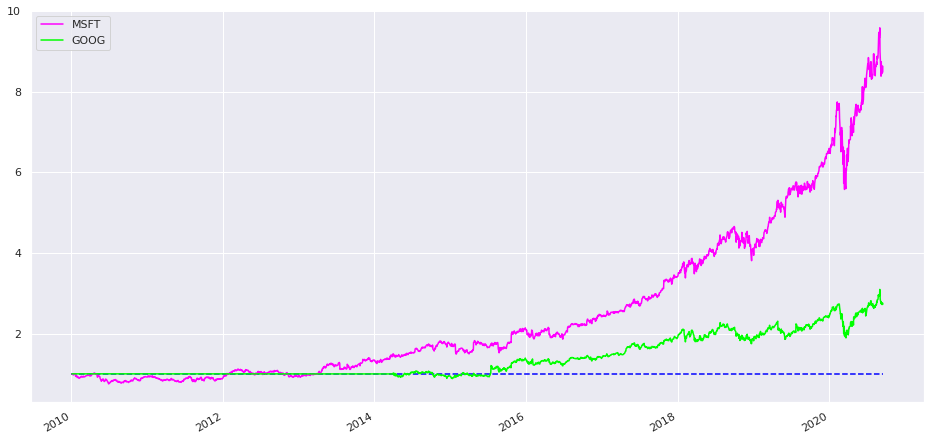

In [37]:
#tesla['cumRet'].plot(label='Tesla', figsize=(16,8))
#gm['cumRet'].plot(label='gm', figsize=(16,8))
#ford['cumRet'].plot(label='Ford', figsize=(16,8));
import seaborn as sns 
sns.set()
#sns.reset_orig



#plt.figure()



color_list = [color_dict.get(x, _) for x in pf.columns]
df_cum_returns.plot(label='Acum.Returns',color=color_list,figsize=(16,8))
plt.hlines(1, startd,endd,colors='blue', linestyles='--')
plt.legend(loc=2);
plt.minorticks_on()
# Customize the major grid
plt.grid(which='major', linestyle='-', linewidth='0.5', color='dimgray')
# Customize the minor grid
plt.grid(which='minor', linestyle=':', linewidth='0.25', color='gray')


color_list = [color_dict.get(x, _) for x in pf.columns]
df_cum_returns[['MSFT','GOOG']].plot(label='Acum.Returns',color=color_list,figsize=(16,8))
plt.hlines(1, startd,endd,colors='blue', linestyles='--')
plt.legend(loc=2);






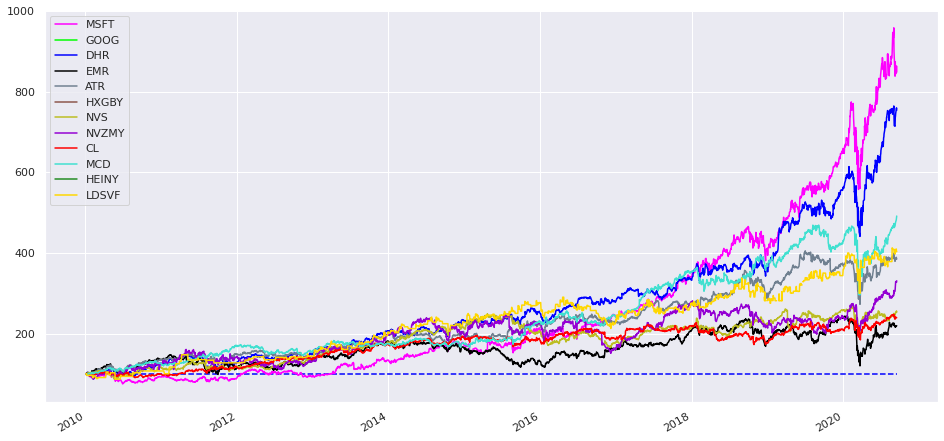

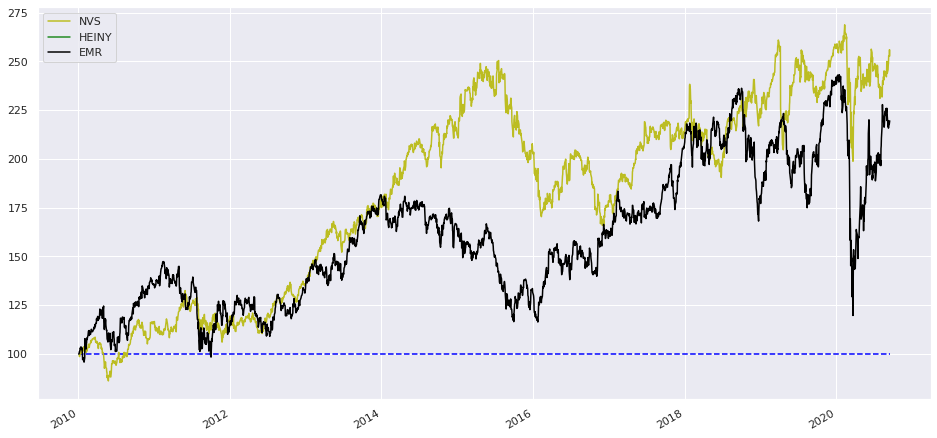

In [38]:
color_list = [color_dict.get(x, _) for x in pf.columns]
(pf / pf.iloc[0] * 100).plot(color=color_list,figsize=(16, 8))
plt.hlines(100, startd,endd,colors='blue', linestyles='--')
plt.legend(loc=2);

color_list = [color_dict.get(x, _) for x in ['NVS','HEINY','EMR']]
(pf[['NVS','HEINY','EMR']] / pf[['NVS','HEINY','EMR']].iloc[0] * 100).plot(color=color_list,figsize=(16, 8))
plt.hlines(100, startd,endd,colors='blue', linestyles='--')
plt.legend(loc=2);

                MSFT  GOOG       DHR       EMR       ATR  HXGBY       NVS  \
2010-01-04  0.000000   0.0  0.000000  0.000000  0.000000    0.0  0.000000   
2010-01-05  0.000323   0.0 -0.001198  0.001615 -0.001104    0.0 -0.000950   
2010-01-06 -0.006137   0.0  0.001865  0.008982  0.015193    0.0 -0.003615   
2010-01-07 -0.010335   0.0  0.008245  0.000000  0.000000    0.0 -0.008784   
2010-01-08  0.006830   0.0  0.013980  0.005706  0.000816    0.0  0.008091   

               NVZMY        CL       MCD  HEINY     LDSVF  
2010-01-04  0.000000  0.000000  0.000000    0.0  0.000000  
2010-01-05  0.004063  0.008087 -0.007646    0.0 -0.008482  
2010-01-06 -0.026529 -0.002275 -0.013644    0.0  0.008555  
2010-01-07  0.011547 -0.003960  0.007323    0.0  0.000000  
2010-01-08 -0.017808 -0.017952 -0.000969    0.0 -0.038393  
_____________
                MSFT  GOOG       DHR       EMR       ATR  HXGBY       NVS  \
2010-01-04  0.000000   0.0  0.000000  0.000000  0.000000    0.0  0.000000   
2010-01-0

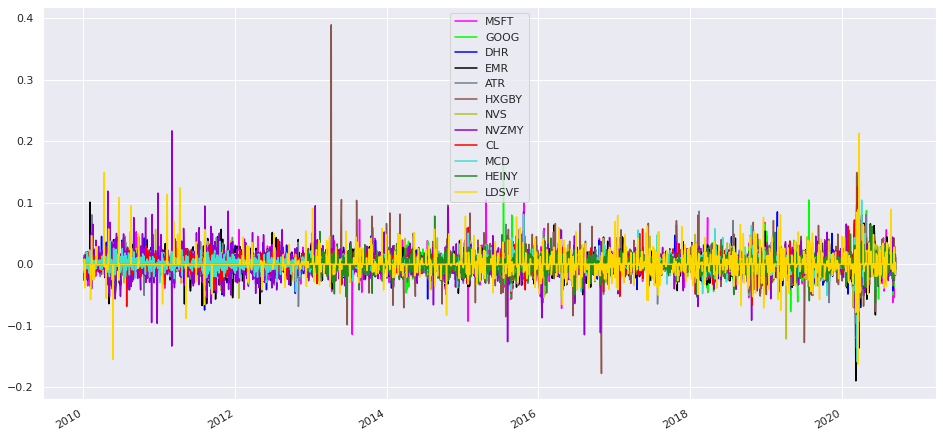

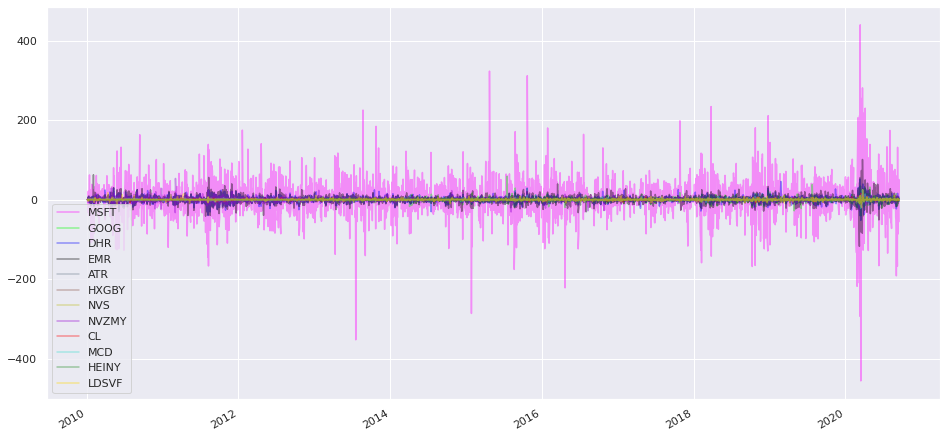

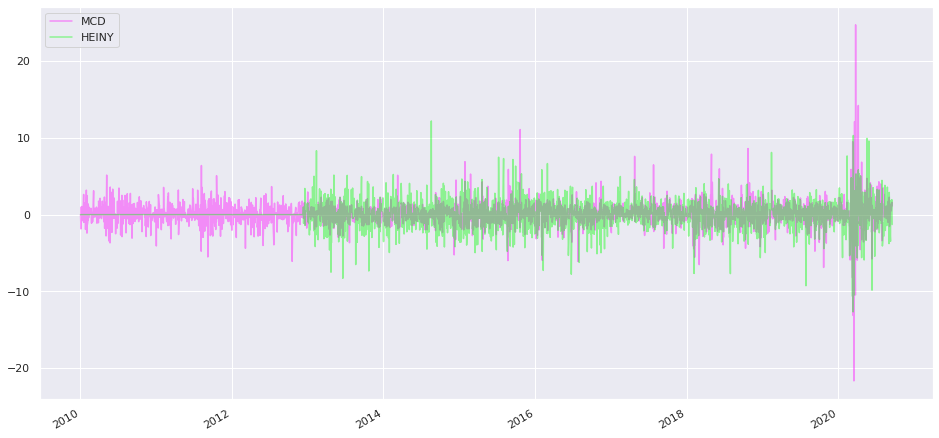

In [39]:
print(df_returns.head())
#sns.reset_orig()
df_returns_aux = determine_earliest_notation(df_returns)

print('_____________')
print(df_returns.head())

color_list = [color_dict.get(x, _) for x in pf.columns]

df_returns.plot(color=color_list, figsize=(16,8))
(df_returns / df_returns_aux).plot(color=color_list,figsize=(16,8), alpha=0.4);

color_list_aux = [color_dict.get(x, _) for x in ['MCD','HEINY']]
(df_returns[['MCD','HEINY']] / df_returns_aux[['MCD','HEINY']]).plot(color=color_list,figsize=(16,8), alpha=0.4);